In [ ]:
from google.colab import drive

drive.mount('/drive')

Drive already mounted at /drive; to attempt to forcibly remount, call drive.mount("/drive", force_remount=True).


**1. Loading data**



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
healthcare0 = pd.read_csv('/drive/MyDrive/Healthcare.csv')

In [ ]:
healthcare0.head()

,id,fu.days,status,drug,age,sex,ascites,hepatom,spiders,edema,bili,chol,albumin,copper,alk.phos,sgot,trig,platelet,protime,stage
0,1,400,death,penicillamine,21464,female,1,1,1,1.0,14.5,261.0,2.60,156.0,1718.0,137.95,172.0,190.0,12.2,4
1,2,4500,censored,penicillamine,20617,female,0,1,1,0.0,1.1,302.0,4.14,54.0,7394.8,113.52,88.0,221.0,10.6,3
2,3,1012,death,penicillamine,25594,male,0,0,0,0.5,1.4,176.0,3.48,210.0,516.0,96.10,55.0,151.0,12.0,4
3,4,1925,death,penicillamine,19994,female,0,1,1,0.5,1.8,244.0,2.54,64.0,6121.8,60.63,92.0,183.0,10.3,4
4,5,1504,censored due to liver tx,placebo,13918,female,0,1,1,0.0,3.4,279.0,3.53,143.0,671.0,113.15,72.0,136.0,10.9,3


In [ ]:
# check duplicate
healthcare_check_duplicate = healthcare0[healthcare0.duplicated()]
# remove duplicate
healthcare = healthcare0.drop_duplicates()

In [ ]:
import sys
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
import pandas_profiling
from pandas_profiling import ProfileReport

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


In [ ]:
# Change the variable name from 'square' to 'healthcare'
profile_healthcare = ProfileReport(healthcare, title="Healthcare", html={'style' : {'full_width':True}})
profile_healthcare.to_file(output_file="healthcare.html")

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile_healthcare

**2a. Data about**

In [ ]:
healthcare.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 312 entries, 0 to 311
Data columns (total 20 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        312 non-null    int64  
 1   fu.days   312 non-null    int64  
 2   status    312 non-null    object 
 3   drug      312 non-null    object 
 4   age       312 non-null    int64  
 5   sex       312 non-null    object 
 6   ascites   312 non-null    int64  
 7   hepatom   312 non-null    int64  
 8   spiders   312 non-null    int64  
 9   edema     312 non-null    float64
 10  bili      312 non-null    float64
 11  chol      284 non-null    float64
 12  albumin   312 non-null    float64
 13  copper    310 non-null    float64
 14  alk.phos  312 non-null    float64
 15  sgot      312 non-null    float64
 16  trig      282 non-null    float64
 17  platelet  308 non-null    float64
 18  protime   312 non-null    float64
 19  stage     312 non-null    int64  
dtypes: float64(10), int64(7), object

**2b. Univariate Analysis**

In [ ]:
healthcare.describe()

,id,fu.days,age,ascites,hepatom,spiders,edema,bili,chol,albumin,copper,alk.phos,sgot,trig,platelet,protime,stage
count,312.000000,312.000000,312.000000,312.000000,312.000000,312.000000,312.000000,312.000000,284.000000,312.000000,310.000000,312.000000,312.000000,282.000000,308.000000,312.000000,312.000000
mean,156.500000,2006.362179,18269.442308,0.076923,0.512821,0.288462,0.110577,3.256090,369.510563,3.520000,97.648387,1982.655769,122.556346,124.702128,261.935065,10.725641,3.032051
std,90.210864,1123.280843,3864.805407,0.266897,0.500639,0.453775,0.274507,4.530315,231.944545,0.419892,85.613920,2140.388824,56.699525,65.148639,95.608742,1.004323,0.877880
min,1.000000,41.000000,9598.000000,0.000000,0.000000,0.000000,0.000000,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.000000
25%,78.750000,1191.000000,15427.750000,0.000000,0.000000,0.000000,0.000000,0.800000,249.500000,3.310000,41.250000,871.500000,80.600000,84.250000,199.750000,10.000000,2.000000
50%,156.500000,1839.500000,18187.500000,0.000000,1.000000,0.000000,0.000000,1.350000,309.500000,3.550000,73.000000,1259.000000,114.700000,108.000000,257.000000,10.600000,3.000000
75%,234.250000,2697.250000,20715.000000,0.000000,1.000000,1.000000,0.000000,3.425000,400.000000,3.800000,123.000000,1980.000000,151.900000,151.000000,322.500000,11.100000,4.000000
max,312.000000,4556.000000,28650.000000,1.000000,1.000000,1.000000,1.000000,28.000000,1775.000000,4.640000,588.000000,13862.400000,457.250000,598.000000,563.000000,17.100000,4.000000


**2c. Missing values**

In [64]:
# Điền missing values bằng giá trị trung bình theo giới tính
healthcare['chol'] = healthcare.groupby('sex')['chol'].transform(lambda x: x.fillna(x.mean()))
healthcare['copper'] = healthcare.groupby('sex')['copper'].transform(lambda x: x.fillna(x.mean()))
healthcare['trig'] = healthcare.groupby('sex')['trig'].transform(lambda x: x.fillna(x.mean()))
healthcare['platelet'] = healthcare.groupby('sex')['platelet'].transform(lambda x: x.fillna(x.mean()))
print(healthcare.head())


   id  fu.days                    status           drug    age sex  ascites  \
0   1      400                     death  penicillamine  21464   1        1   
1   2     4500                  censored  penicillamine  20617   1        0   
2   3     1012                     death  penicillamine  25594   0        0   
3   4     1925                     death  penicillamine  19994   1        0   
4   5     1504  censored due to liver tx        placebo  13918   1        0   

   hepatom  spiders  edema  bili   chol  albumin  copper  alk.phos    sgot  \
0        1        1    1.0  14.5  261.0     2.60   156.0    1718.0  137.95   
1        1        1    0.0   1.1  302.0     4.14    54.0    7394.8  113.52   
2        0        0    0.5   1.4  176.0     3.48   210.0     516.0   96.10   
3        1        1    0.5   1.8  244.0     2.54    64.0    6121.8   60.63   
4        1        1    0.0   3.4  279.0     3.53   143.0     671.0  113.15   

    trig  platelet  protime  stage  
0  172.0     190.0 

In [ ]:
healthcare.isnull().sum()

id          0
fu.days     0
status      0
drug        0
age         0
sex         0
ascites     0
hepatom     0
spiders     0
edema       0
bili        0
chol        0
albumin     0
copper      0
alk.phos    0
sgot        0
trig        0
platelet    0
protime     0
stage       0
dtype: int64

**Đổi male và female sang 0 và 1**

In [ ]:
sex_to_number = {"male": 0, "female": 1}

for i in healthcare.index:
    sex_code = sex_to_number[healthcare.loc[i, 'sex']]
    if sex_code is not None:
        healthcare.at[i, 'sex'] = sex_code

In [ ]:
healthcare.head()

,id,fu.days,status,drug,age,sex,ascites,hepatom,spiders,edema,bili,chol,albumin,copper,alk.phos,sgot,trig,platelet,protime,stage
0,1,400,death,penicillamine,21464,1,1,1,1,1.0,14.5,261.0,2.60,156.0,1718.0,137.95,172.0,190.0,12.2,4
1,2,4500,censored,penicillamine,20617,1,0,1,1,0.0,1.1,302.0,4.14,54.0,7394.8,113.52,88.0,221.0,10.6,3
2,3,1012,death,penicillamine,25594,0,0,0,0,0.5,1.4,176.0,3.48,210.0,516.0,96.10,55.0,151.0,12.0,4
3,4,1925,death,penicillamine,19994,1,0,1,1,0.5,1.8,244.0,2.54,64.0,6121.8,60.63,92.0,183.0,10.3,4
4,5,1504,censored due to liver tx,placebo,13918,1,0,1,1,0.0,3.4,279.0,3.53,143.0,671.0,113.15,72.0,136.0,10.9,3


In [ ]:
#xuất file
healthcare.to_csv('healthcare1.csv', index=False)

**3a. Data Manipulation**

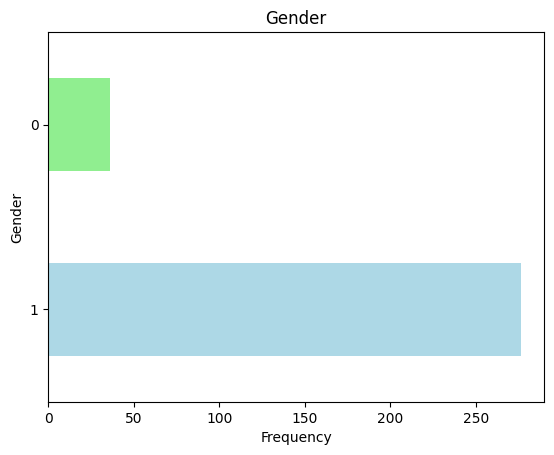

In [ ]:
healthcare["sex"].value_counts().plot.barh(title='Gender', color=['lightblue', 'lightgreen'])
plt.xlabel('Frequency')
plt.ylabel('Gender')
plt.show()

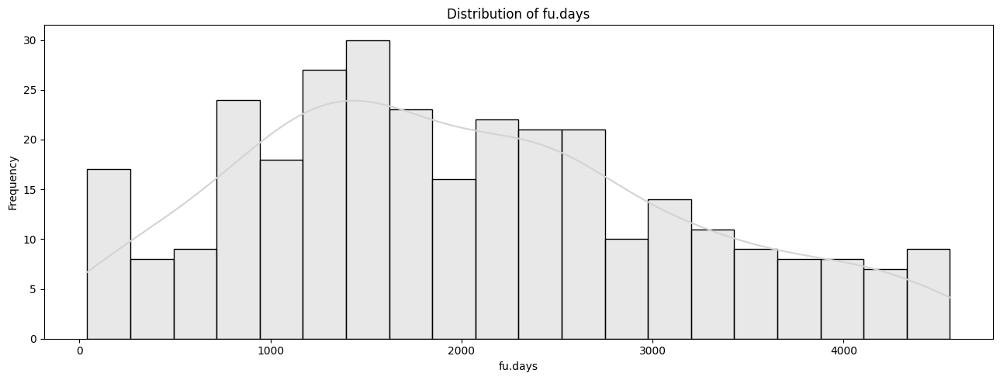

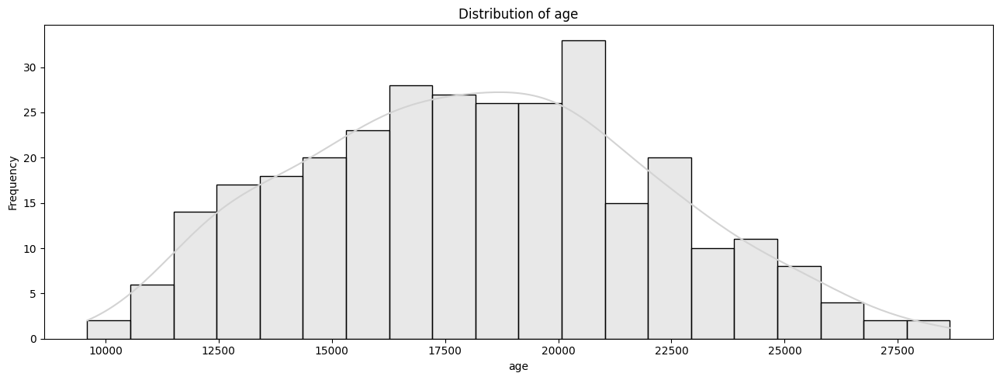

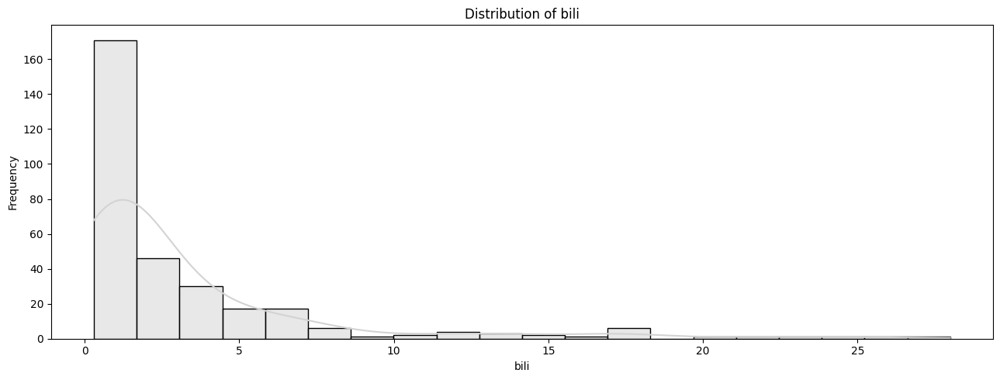

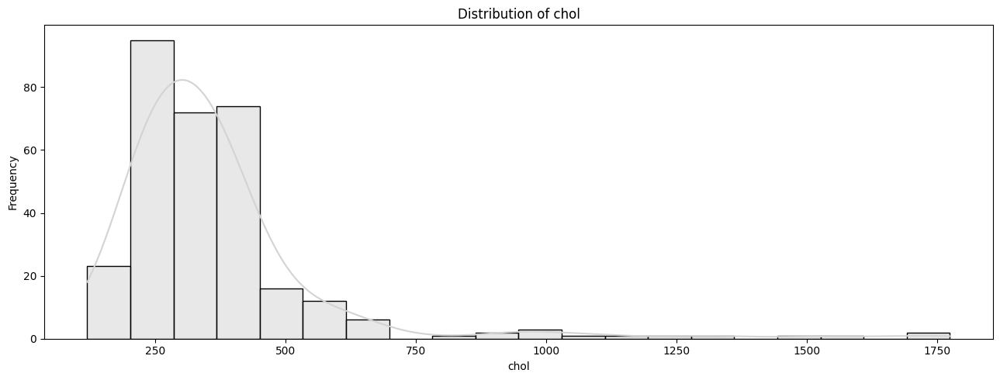

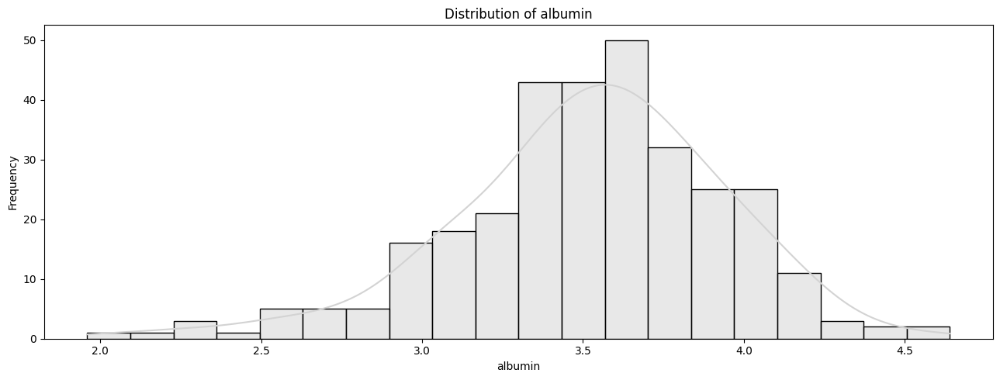

...

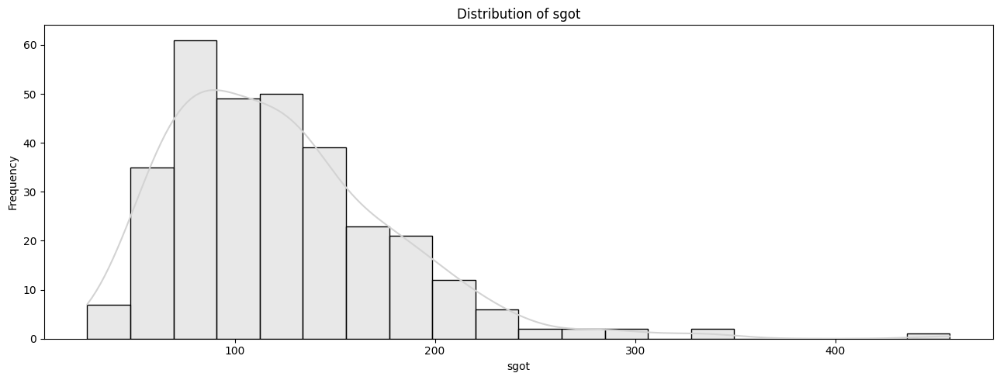

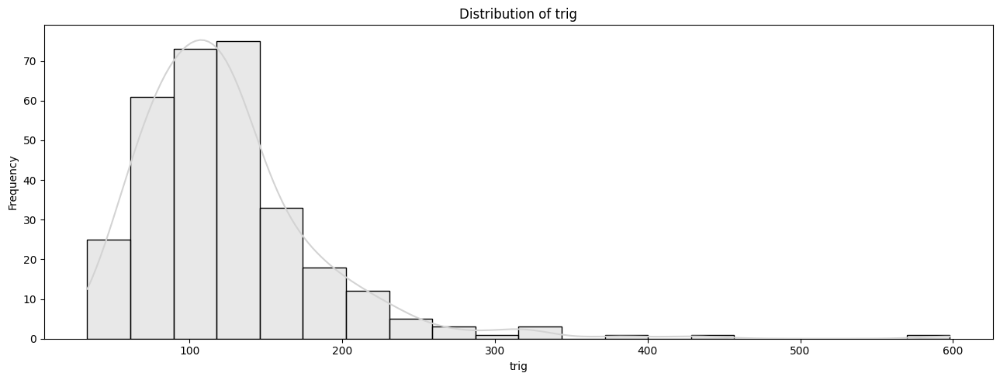

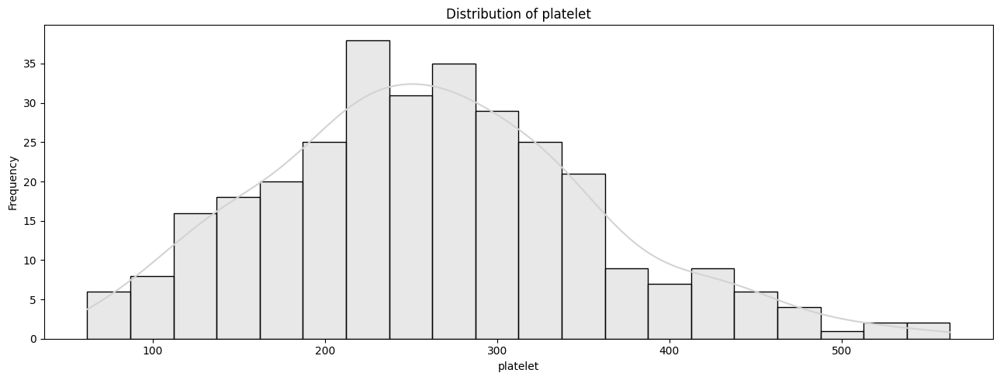

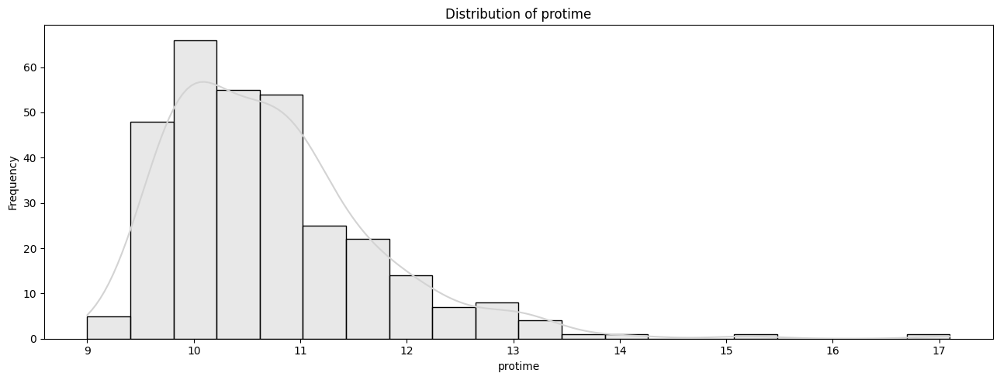

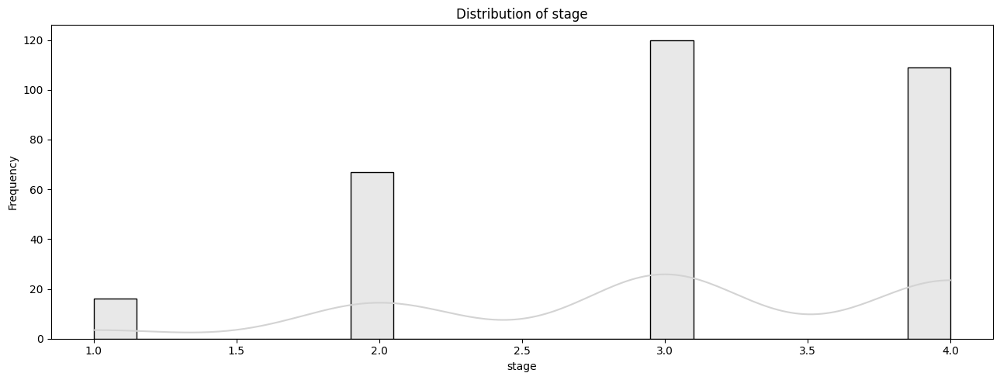

In [ ]:
columns_to_plot = ['fu.days','age', 'bili', 'chol', 'albumin', 'copper', 'alk.phos', 'sgot', 'trig', 'platelet', 'protime', 'stage']
for column in columns_to_plot:
   plt.figure(figsize=(13, 5))
   sns.histplot(data=healthcare, x=column, bins=20, kde=True, color="lightgray")
   plt.xlabel(column)
   plt.ylabel("Frequency")
   plt.title(f"Distribution of {column}")
   plt.tight_layout()
   plt.show()

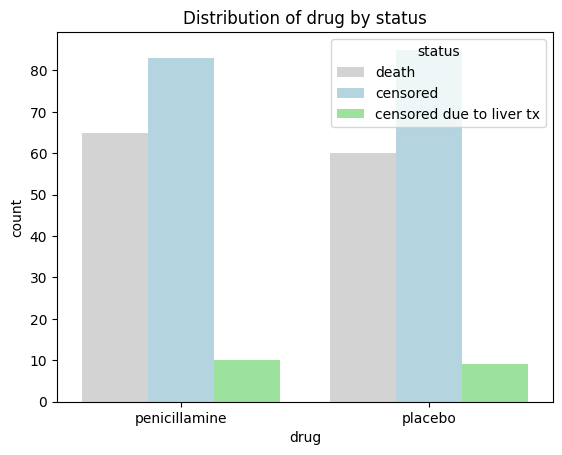

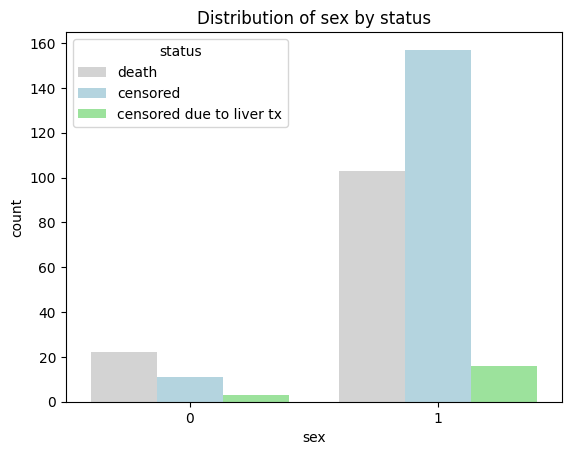

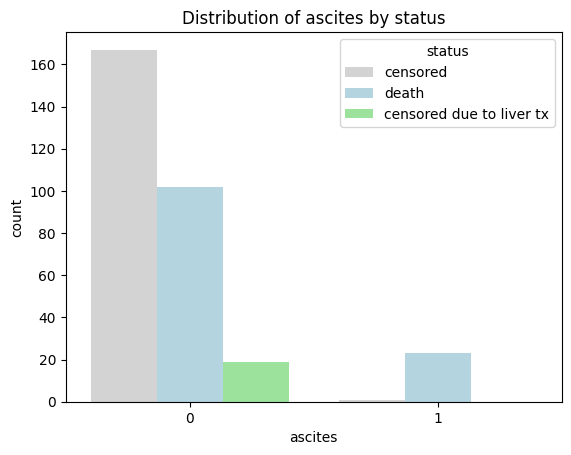

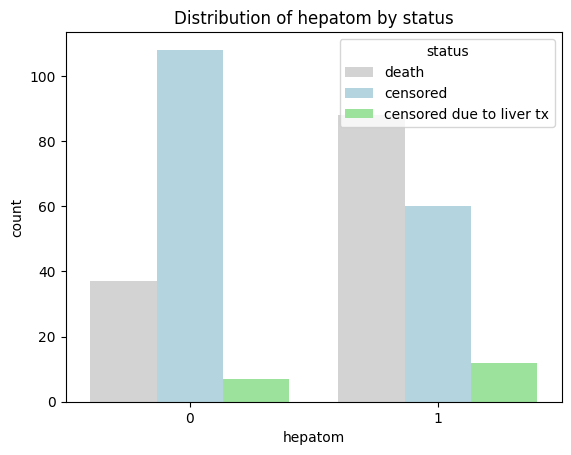

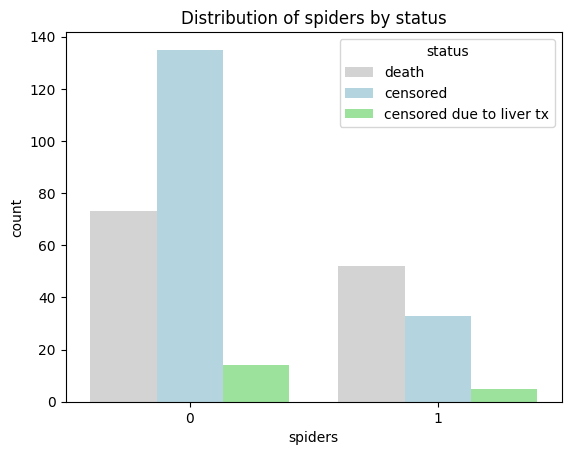

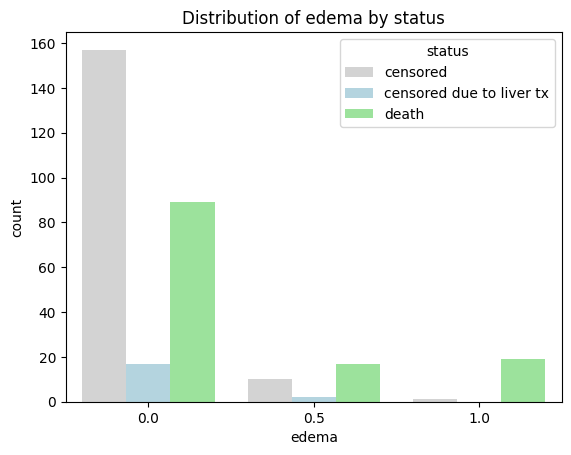

In [ ]:
columns_to_plot = ['drug', 'sex', 'ascites', 'hepatom', 'spiders', 'edema']

for col in columns_to_plot:
    palette = sns.color_palette(['lightgray','lightblue',"lightgreen"])
    sns.countplot(x=col, hue='status', data=healthcare, palette=palette)
    plt.title(f"Distribution of {col} by status")
    plt.show()

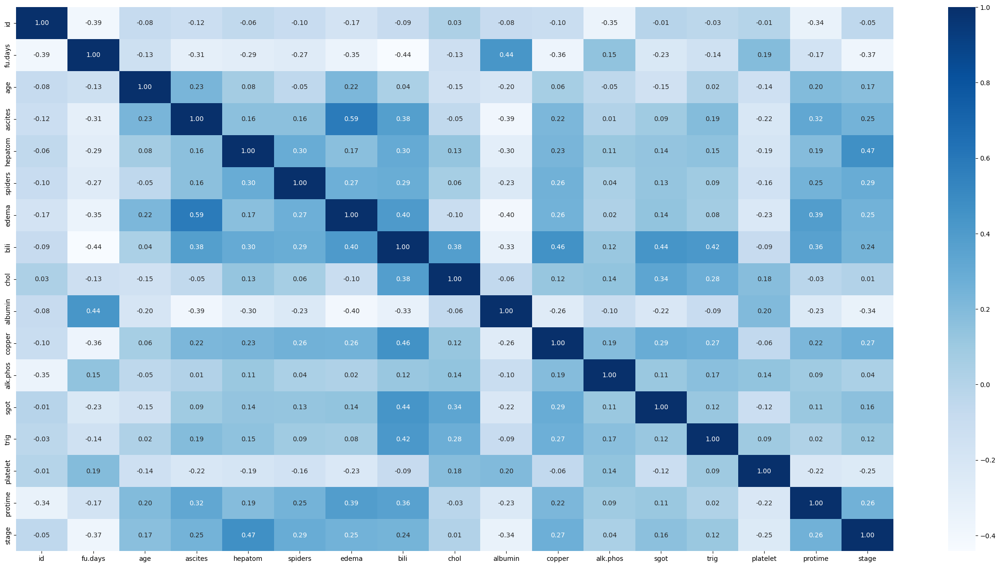

In [ ]:
numeric_columns = healthcare.select_dtypes(include=['number']).columns
light_blue_palette = sns.color_palette("Blues", as_cmap=True)
plt.figure(figsize=(30, 15))
sns.heatmap(healthcare[numeric_columns].corr(), annot=True, fmt=".2f", cmap=light_blue_palette)
plt.show()